In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import json

## 加载metadata

In [4]:

data = []
# 逐行读取JSON文件
with open(r'D:\project\legal\data\raw_datasets\chinese law and regulations\metadata.json', 'r', encoding='utf-8') as file:
    for line in file:
        # 去除行首尾的空白符
        line = line.strip()
        # 将每行的JSON字符串解析为Python字典，并添加到数据列表中
        if line:  # 确保行不为空
            data.append(json.loads(line))

# 将JSON数据转换为DataFrame
df = pd.DataFrame(data)

# 输出前几行数据查看
print(df.head())


          publish_date       effective_date type status                 title  \
0  2018-03-11 00:00:00  2018-03-11 00:00:00   宪法     有效   中华人民共和国宪法修正案（2018年）   
1  2018-03-11 00:00:00  2018-03-11 00:00:00   宪法     有效  中华人民共和国宪法（2018年修正文本）   
2  2004-03-14 00:00:00  2004-03-14 00:00:00   宪法     有效   中华人民共和国宪法修正案（2004年）   
3  1999-03-15 00:00:00  1999-03-15 00:00:00   宪法     有效   中华人民共和国宪法修正案（1999年）   
4  1993-03-29 00:00:00  1993-03-29 00:00:00   宪法     有效   中华人民共和国宪法修正案（1993年）   

     office office_level office_category effective_period  
0  全国人民代表大会     全国人民代表大会          人民代表大会        2000_2020  
1  全国人民代表大会     全国人民代表大会          人民代表大会        2000_2020  
2  全国人民代表大会     全国人民代表大会          人民代表大会        2000_2020  
3  全国人民代表大会     全国人民代表大会          人民代表大会        1980_2000  
4  全国人民代表大会     全国人民代表大会          人民代表大会        1980_2000  


In [2]:
import warnings
import matplotlib
warnings.filterwarnings('ignore')
# 设置绘图风格
plt.style.use('seaborn-whitegrid')
# 设置matplotlib正常显示中文和负号
matplotlib.rcParams['font.sans-serif']=['SimHei']   # 用黑体显示中文
matplotlib.rcParams['axes.unicode_minus']=False     # 正常显示负号

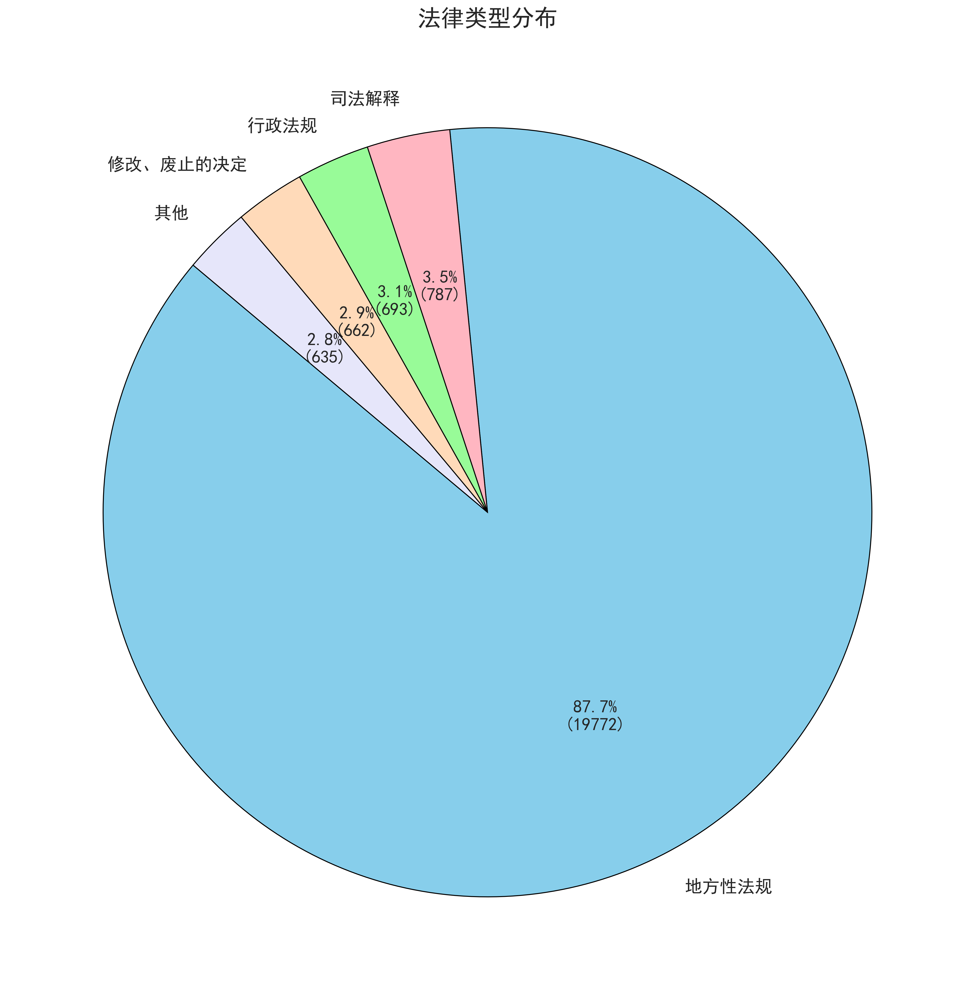

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# 假设已经有df数据
type_counts = df['type'].value_counts()

# 设置一个阈值，小于该值的类别将合并为“其他”
threshold = 500
type_counts_mod = type_counts.copy()

# 将低于阈值的类型归类为“其他”
other_count = type_counts_mod[type_counts < threshold].sum()
type_counts_mod = type_counts_mod[type_counts >= threshold]
type_counts_mod['其他'] = other_count

# 定义淡色系颜色列表
light_colors = ['#87CEEB', '#FFB6C1', '#98FB98', '#FFDAB9', '#E6E6FA', '#F0E68C', '#ADD8E6', '#FFC0CB', '#B0E0E6', '#D8BFD8']

plt.figure(figsize=(14, 18),dpi=300)

# 自定义字体大小
def custom_autopct(p):
    total = sum(type_counts_mod)
    val = int(p * total / 100)
    return f'{p:.1f}%\n({val})'

# 绘制饼状图
type_counts_mod.plot.pie(
    autopct=lambda p: f'{p:.1f}%\n({int(p * sum(type_counts_mod) / 100)})',  # 使用自定义函数显示百分比和数量
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}  # 设置中文字体大小
)

# 调整数字部分的字体大小
for text in plt.gca().texts:
    if text.get_text().isdigit():
        text.set_fontsize(12)  # 数字字体大小设置为12
    else:
        text.set_fontsize(18)  # 中文字体大小设置为16
plt.title('法律类型分布', fontsize=24)
plt.ylabel('')  # 隐藏Y轴标签
plt.tight_layout()  # 自动调整子图参数，避免标题或标签重叠

plt.savefig('1.png', dpi=300)
plt.show()

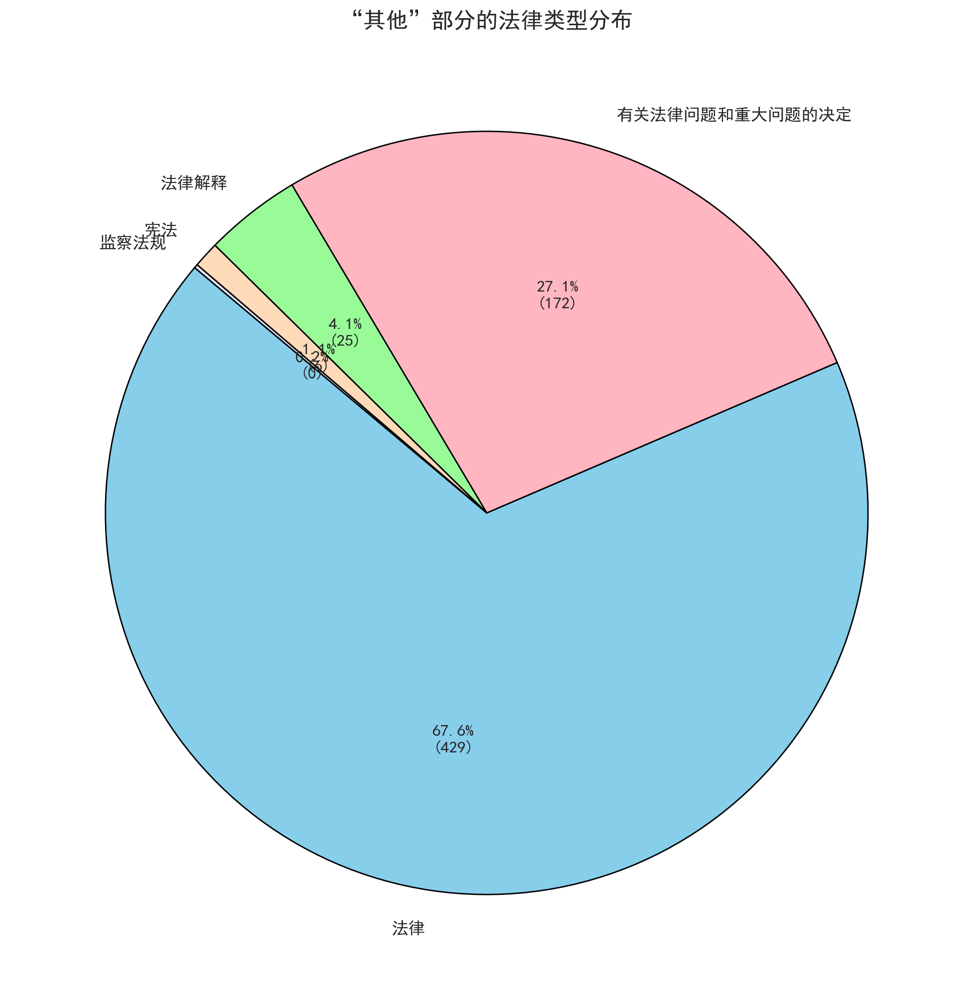

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

# 假设已经有df数据
type_counts = df['type'].value_counts()

# 设置一个阈值，小于该值的类别将合并为“其他”
threshold = 500
type_counts_mod = type_counts.copy()

# 将低于阈值的类型归类为“其他”
other_mask = type_counts_mod < threshold
other_count = type_counts_mod[other_mask].sum()
type_counts_mod = type_counts_mod[~other_mask]
type_counts_mod['其他'] = other_count

# 提取“其他”部分的细节
other_detail_counts = df[df['type'].isin(type_counts[other_mask].index)]['type'].value_counts()

# 定义淡色系颜色列表
light_colors = ['#87CEEB', '#FFB6C1', '#98FB98', '#FFDAB9', '#E6E6FA', '#F0E68C', '#ADD8E6', '#FFC0CB', '#B0E0E6', '#D8BFD8']

plt.figure(figsize=(10, 10), dpi=200)  # 增加图表大小，并设置高DPI以提高清晰度

# 绘制“其他”部分的饼状图，显示百分比和实际数量
other_detail_counts.plot.pie(
    autopct=lambda p: f'{p:.1f}%\n({int(p * sum(other_detail_counts) / 100)})',
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 12}  # 设置字体大小
)

plt.title('“其他”部分的法律类型分布', fontsize=16)
plt.ylabel('')  # 隐藏Y轴标签
plt.tight_layout()  # 自动调整子图参数，避免标题或标签重叠
plt.show()


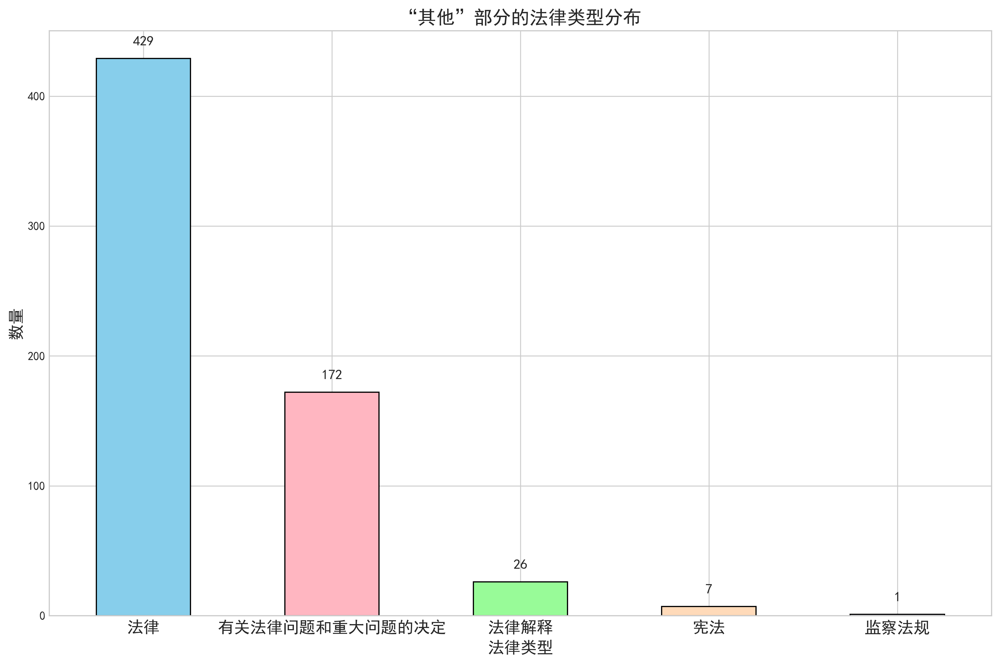

In [26]:
import matplotlib.pyplot as plt
import pandas as pd

# 假设已经有df数据
type_counts = df['type'].value_counts()

# 设置一个阈值，小于该值的类别将合并为“其他”
threshold = 500
type_counts_mod = type_counts.copy()

# 将低于阈值的类型归类为“其他”
other_mask = type_counts_mod < threshold
other_count = type_counts_mod[other_mask].sum()
type_counts_mod = type_counts_mod[~other_mask]
type_counts_mod['其他'] = other_count

# 提取“其他”部分的细节
other_detail_counts = df[df['type'].isin(type_counts[other_mask].index)]['type'].value_counts()

# 定义淡色系颜色列表
light_colors = ['#87CEEB', '#FFB6C1', '#98FB98', '#FFDAB9', '#E6E6FA', '#F0E68C', '#ADD8E6', '#FFC0CB', '#B0E0E6', '#D8BFD8']

plt.figure(figsize=(12, 8), dpi=300)  # 设置图表大小和分辨率

# 绘制柱状图
other_detail_counts.plot.bar(
    color=light_colors,
    edgecolor='black'
)

# 添加标题和标签
plt.title('“其他”部分的法律类型分布', fontsize=16)
plt.xlabel('法律类型', fontsize=14)
# 旋转横坐标上的数字
plt.xticks(rotation=0, fontsize=14)
plt.ylabel('数量', fontsize=14)

# 显示具体数量在柱状图顶部
for index, value in enumerate(other_detail_counts):
    plt.text(index, value + 10, str(value), ha='center', fontsize=12)

plt.tight_layout()  # 自动调整子图参数，避免标题或标签重叠
plt.show()


In [28]:
import pandas as pd

# 假设已经加载了数据并存储在df中
# df = pd.read_json('your_data_file.json')

# 定义要过滤的法律类型
legal_types = ['宪法', '法律', '行政法规']

# 过滤出“宪法”、“法律”和“行政法规”的数据
filtered_df = df[df['type'].isin(legal_types)]

# 过滤出地方性文件中带有“上海”的“地方性法规”部分
shanghai_local_laws = df[(df['type'] == '地方性法规') & (df['title'].str.contains('上海'))]

# 合并两个数据集
final_df = pd.concat([filtered_df, shanghai_local_laws])

# 保存为新的JSON文件
final_df.to_json('filtered_laws_20240812.json', orient='records', force_ascii=False, indent=4)

# 打印过滤后的数据框的形状以确认记录数
final_df.shape
# 打印过滤后的数据框的形状以确认记录数
print(final_df.shape)



(1505, 9)


# 过滤后文件

In [29]:
final_df.head

<bound method NDFrame.head of               publish_date       effective_date   type status  \
0      2018-03-11 00:00:00  2018-03-11 00:00:00     宪法     有效   
1      2018-03-11 00:00:00  2018-03-11 00:00:00     宪法     有效   
2      2004-03-14 00:00:00  2004-03-14 00:00:00     宪法     有效   
3      1999-03-15 00:00:00  1999-03-15 00:00:00     宪法     有效   
4      1993-03-29 00:00:00  1993-03-29 00:00:00     宪法     有效   
...                    ...                  ...    ...    ...   
22364                 None                 None  地方性法规     有效   
22406                 None                 None  地方性法规    已修改   
22410                 None                 None  地方性法规    已废止   
22496                 None                 None  地方性法规     有效   
22540  2008-12-25 00:00:00                 None  地方性法规     有效   

                      title          office office_level office_category  \
0       中华人民共和国宪法修正案（2018年）        全国人民代表大会     全国人民代表大会          人民代表大会   
1      中华人民共和国宪法（2018年修正文本）        全国

## 其他字段可视化

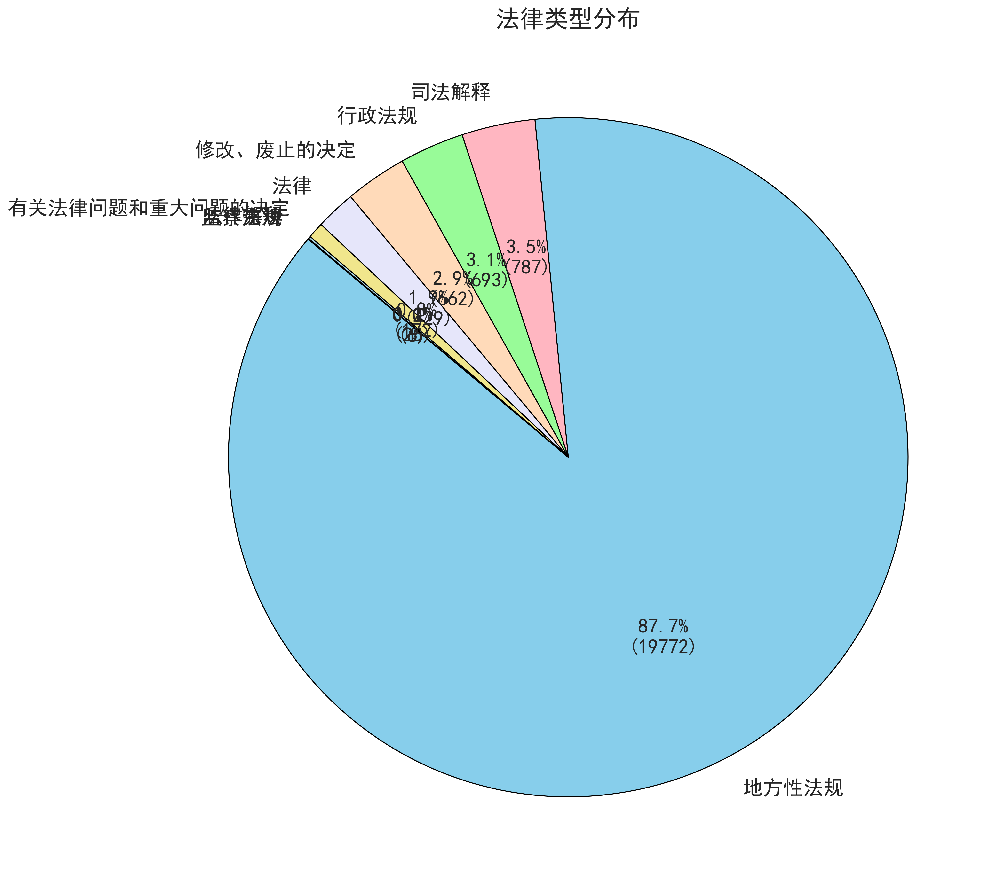

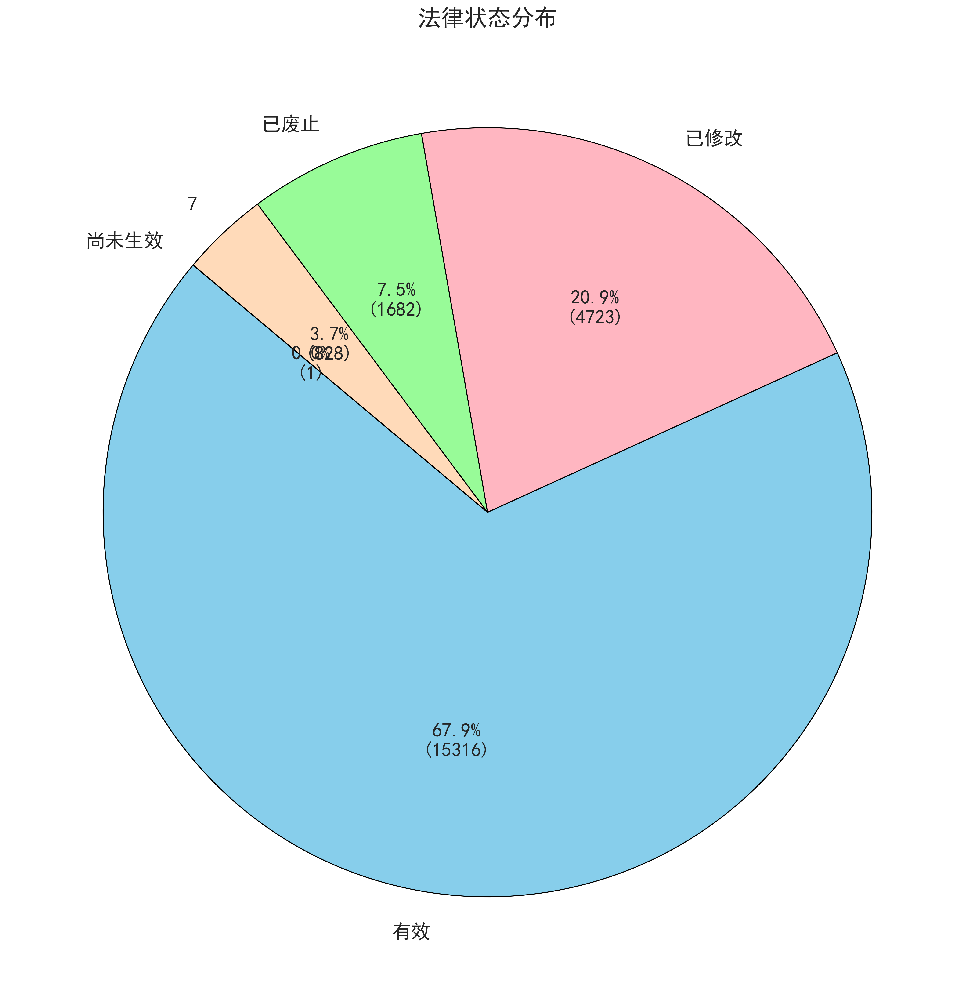

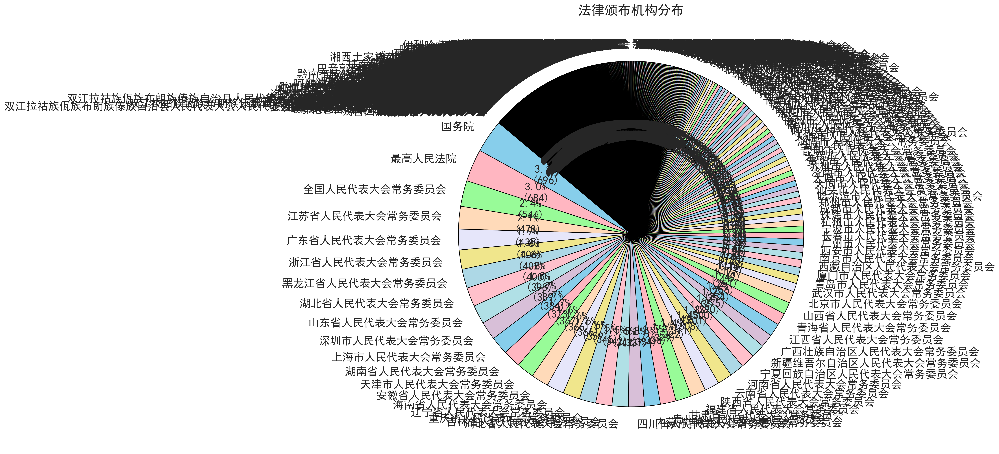

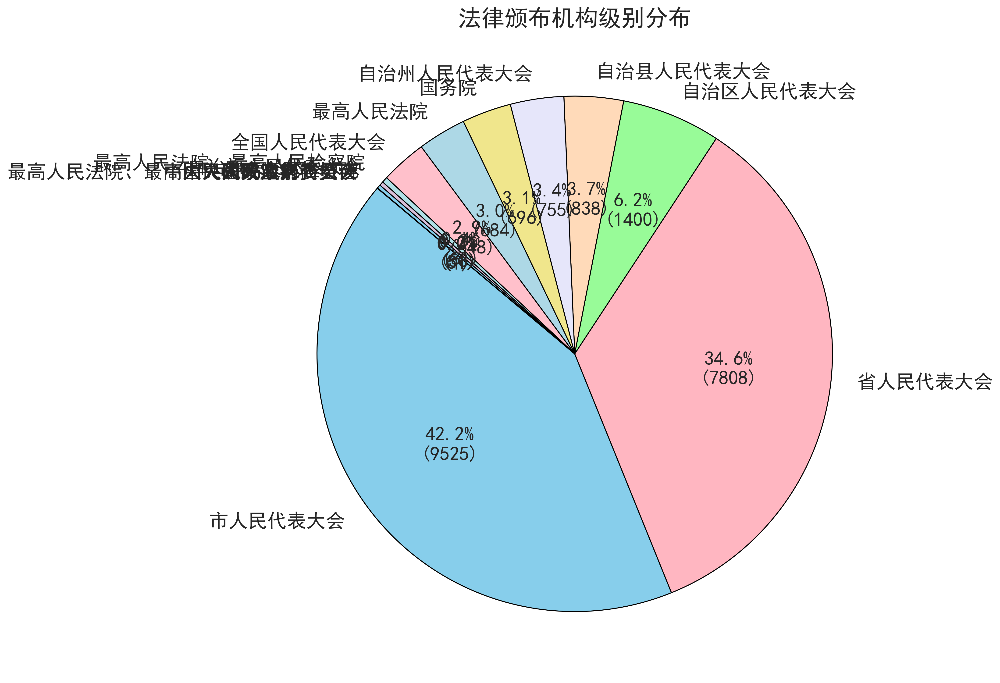

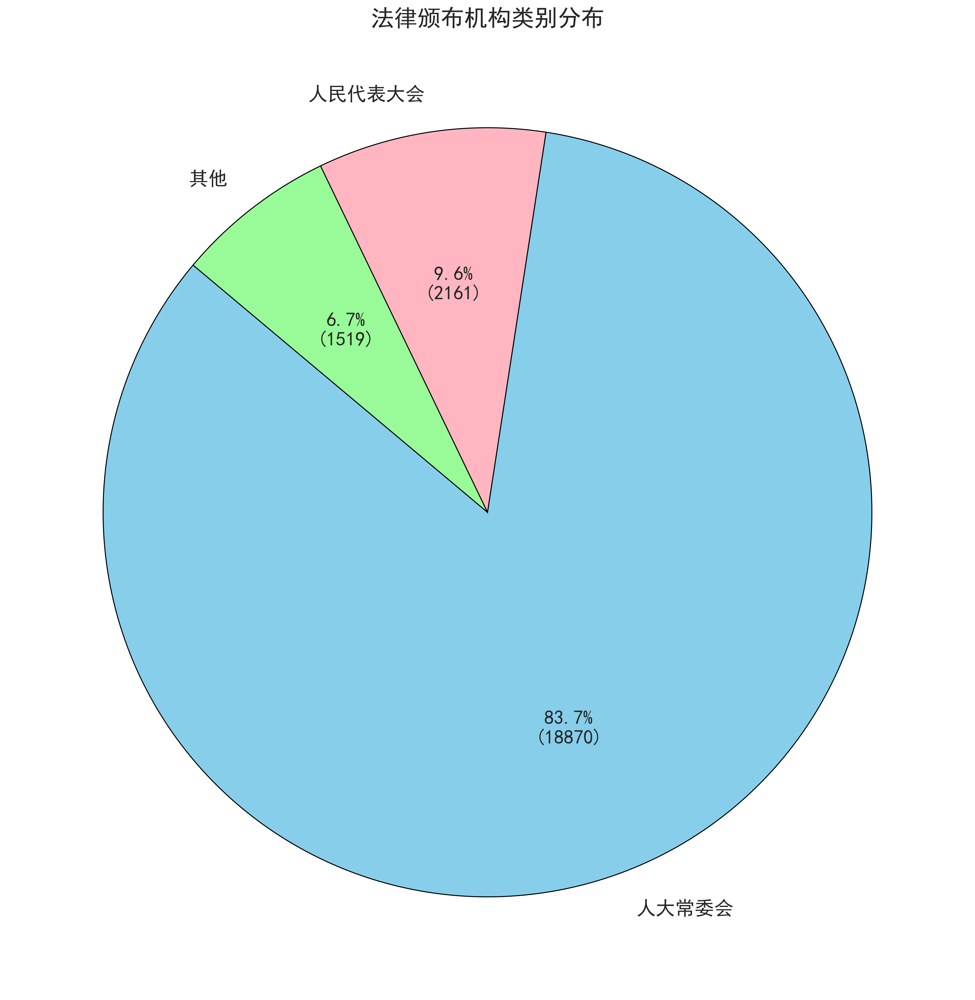

In [48]:
import matplotlib.pyplot as plt
import pandas as pd

# 定义淡色系颜色列表
light_colors = ['#87CEEB', '#FFB6C1', '#98FB98', '#FFDAB9', '#E6E6FA', '#F0E68C', '#ADD8E6', '#FFC0CB', '#B0E0E6', '#D8BFD8']

# 自定义字体大小的百分比和数量显示函数
def custom_autopct(p, total):
    val = int(p * total / 100)
    return f'{p:.1f}%\n({val})'

# 可视化字段："type"
type_counts = df['type'].value_counts()
plt.figure(figsize=(14, 18), dpi=300)
type_counts.plot.pie(
    autopct=lambda p: custom_autopct(p, type_counts.sum()),
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}
)
plt.title('法律类型分布', fontsize=24)
plt.ylabel('')
plt.tight_layout()
plt.show()

# 可视化字段："status"
status_counts = df['status'].value_counts()
plt.figure(figsize=(14, 18), dpi=300)
status_counts.plot.pie(
    autopct=lambda p: custom_autopct(p, status_counts.sum()),
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}
)
plt.title('法律状态分布', fontsize=24)
plt.ylabel('')
plt.tight_layout()
plt.show()

# 可视化字段："office"
office_counts = df['office'].value_counts()
plt.figure(figsize=(14, 18), dpi=300)
office_counts.plot.pie(
    autopct=lambda p: custom_autopct(p, office_counts.sum()),
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}
)
plt.title('法律颁布机构分布', fontsize=24)
plt.ylabel('')
plt.tight_layout()
plt.show()

# 可视化字段："office_level"
office_level_counts = df['office_level'].value_counts()
plt.figure(figsize=(14, 18), dpi=300)
office_level_counts.plot.pie(
    autopct=lambda p: custom_autopct(p, office_level_counts.sum()),
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}
)
plt.title('法律颁布机构级别分布', fontsize=24)
plt.ylabel('')
plt.tight_layout()
plt.show()

# 可视化字段："office_category"
office_category_counts = df['office_category'].value_counts()
plt.figure(figsize=(14, 18), dpi=300)
office_category_counts.plot.pie(
    autopct=lambda p: custom_autopct(p, office_category_counts.sum()),
    startangle=140,
    colors=light_colors,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}
)
plt.title('法律颁布机构类别分布', fontsize=24)
plt.ylabel('')
plt.tight_layout()
plt.show()


# 过滤有效的上位法

In [49]:


# 假设final_df已经加载，并包含所有法律文件的数据
# final_df = pd.read_json('your_final_df_file.json')  # 如果需要加载数据

# 过滤状态为"有效"的文件
filtered_valid_df = final_df[final_df['status'] == '有效']

# 输出过滤后的DataFrame的形状
print(filtered_valid_df.shape)


(1165, 9)


In [52]:
filtered_valid_df.head

<bound method NDFrame.head of               publish_date       effective_date   type status  \
0      2018-03-11 00:00:00  2018-03-11 00:00:00     宪法     有效   
1      2018-03-11 00:00:00  2018-03-11 00:00:00     宪法     有效   
2      2004-03-14 00:00:00  2004-03-14 00:00:00     宪法     有效   
3      1999-03-15 00:00:00  1999-03-15 00:00:00     宪法     有效   
4      1993-03-29 00:00:00  1993-03-29 00:00:00     宪法     有效   
...                    ...                  ...    ...    ...   
22083  2019-01-31 00:00:00  2019-07-01 00:00:00  地方性法规     有效   
22170  2017-06-23 00:00:00  2017-07-01 00:00:00  地方性法规     有效   
22364                 None                 None  地方性法规     有效   
22496                 None                 None  地方性法规     有效   
22540  2008-12-25 00:00:00                 None  地方性法规     有效   

                                    title          office office_level  \
0                     中华人民共和国宪法修正案（2018年）        全国人民代表大会     全国人民代表大会   
1                    中华人民共和国宪法（2018年修正文本）

### 过滤后的文件分析

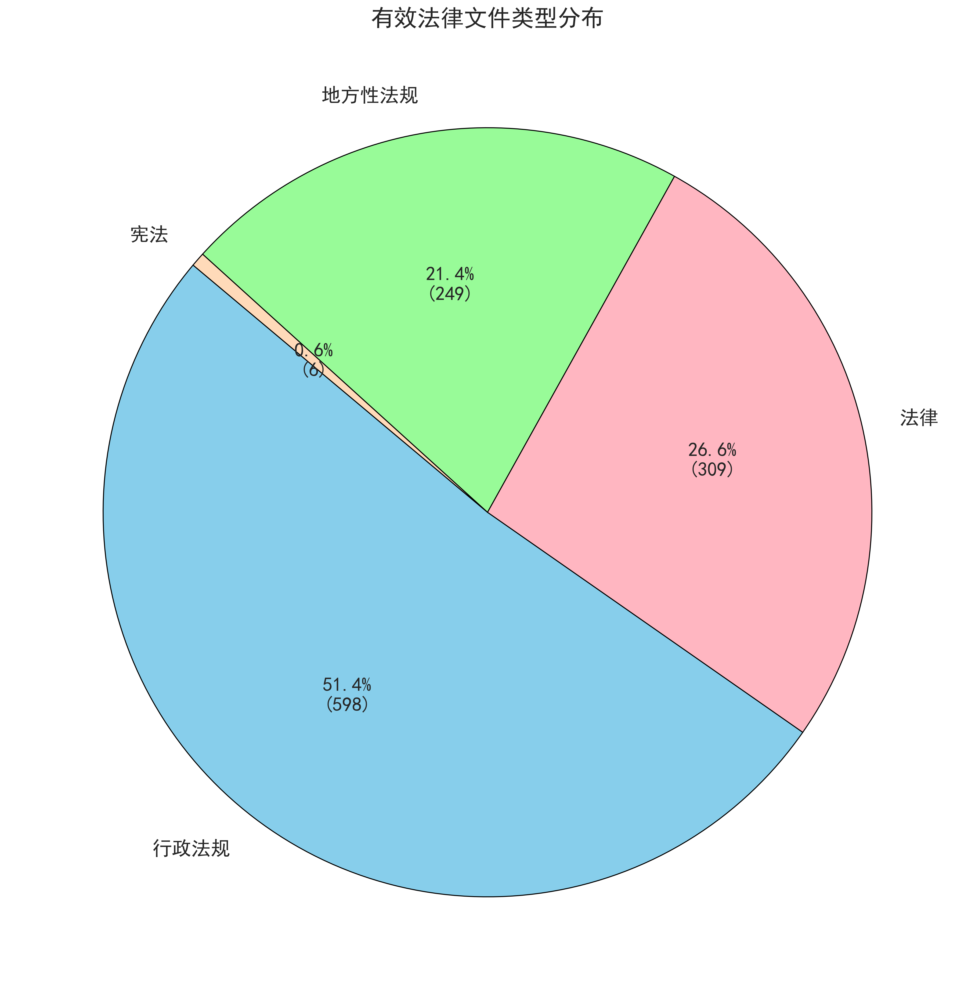

In [50]:
import matplotlib.pyplot as plt

# 法律类型分布
type_counts = filtered_valid_df['type'].value_counts()

plt.figure(figsize=(14, 18), dpi=300)
type_counts.plot.pie(
    autopct=lambda p: f'{p:.1f}%\n({int(p * sum(type_counts) / 100)})',
    startangle=140,
    colors=['#87CEEB', '#FFB6C1', '#98FB98', '#FFDAB9', '#E6E6FA', '#F0E68C', '#ADD8E6', '#FFC0CB', '#B0E0E6', '#D8BFD8'],
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 20}
)
plt.title('有效法律文件类型分布', fontsize=24)
plt.ylabel('')
plt.tight_layout()
plt.show()


### 保存过滤后的标题的列表

In [56]:
titles = filtered_valid_df['title'].tolist()

# 保存标题列表到文本文件
with open('filtered_law_titles.txt', 'w', encoding='utf-8') as f:
    for idx, title in enumerate(titles, start=1):
        f.write(f"{idx}. {title}\n")

print("法律标题列表已保存到 filtered_law_titles.txt")

法律标题列表已保存到 filtered_law_titles.txt


### 打印3个标题

In [57]:
import pandas as pd

# 假设 filtered_valid_df 已经定义并包含过滤后的法律数据

# 获取每个类型的法律
law_types = filtered_valid_df['type'].unique()

# 打印每个类型的前3个法律标题
for law_type in law_types:
    print(f"类型: {law_type}")
    subset = filtered_valid_df[filtered_valid_df['type'] == law_type]['title'].head(3)
    for idx, title in enumerate(subset, start=1):
        print(f"  {idx}. {title}")
    print("\n")


类型: 宪法
  1. 中华人民共和国宪法修正案（2018年）
  2. 中华人民共和国宪法（2018年修正文本）
  3. 中华人民共和国宪法修正案（2004年）


类型: 法律
  1. 中华人民共和国对外关系法
  2. 中华人民共和国全国人民代表大会常务委员会议事规则
  3. 中华人民共和国立法法


类型: 行政法规
  1. 互联网上网服务营业场所管理条例
  2. 私募投资基金监督管理条例
  3. 农药管理条例


类型: 地方性法规
  1. 上海市无障碍环境建设条例
  2. 上海市浦东新区固体废物资源化再利用若干规定
  3. 上海市船舶污染防治条例




## 合并内容，处理相关的上位法文件

In [60]:
import pandas as pd
import json

# 加载已过滤的法律文件的DataFrame
# 假设 filtered_valid_df 是已经过滤的DataFrame
# filtered_valid_df = pd.read_json('path_to_filtered_valid_df.json')
big_file_data =[]
# 加载包含法律文本的JSON文件
with open(r'D:\project\big_file\default.json', 'r', encoding='utf-8') as file:
    for line in file:
    # 去除行首尾的空白符
        line = line.strip()
        # 将每行的JSON字符串解析为Python字典，并添加到数据列表中
        if line:  # 确保行不为空
            big_file_data.append(json.loads(line))

# 将 'content' 字段添加到过滤后的 DataFrame 中
# 假设 big_file_data 是一个列表，里面包含多个字典，每个字典都有 'title' 和 'content'
# 确保 big_file_data 中的 title 与 filtered_valid_df 中的 title 匹配

# 创建一个字典来映射 title 到 content
content_mapping = {entry['title']: entry['content'] for entry in big_file_data}

# 将 content 列加入到 filtered_valid_df 中
filtered_valid_df['content'] = filtered_valid_df['title'].map(content_mapping)

# 将 DataFrame 转换为 JSON 对象列表
records = filtered_valid_df.to_dict(orient='records')
with open('filtered_laws_with_content_20240812.json', 'w', encoding='utf-8') as f:
    for record in records:
        json_record = json.dumps(record, ensure_ascii=False)
        f.write(json_record + '\n')

print("相关法律文本已保存到 filtered_laws_with_content_20240812.json")


相关法律文本已保存到 filtered_laws_with_content_20240812.json


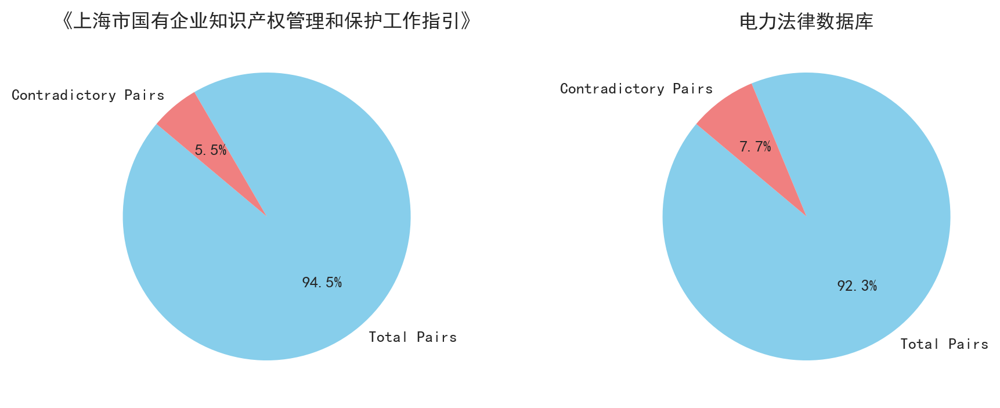

: 

In [25]:
import matplotlib.pyplot as plt

# 定义数据
labels = ['Total Pairs', 'Contradictory Pairs']
sizes_1 = [400-22, 22]
sizes_2 = [23540-1802, 1802]

# 定义颜色
colors = ['skyblue', 'lightcoral']

# 创建第一个饼图
plt.figure(figsize=(10, 5),dpi=200)

plt.subplot(121)
plt.pie(sizes_1, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('《上海市国有企业知识产权管理和保护工作指引》')

# 创建第二个饼图
plt.subplot(122)
plt.pie(sizes_2, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('电力法律数据库')

# 设置饼图的显示比例，使得饼图的面积反映总数差异
plt.subplots_adjust(wspace=0.5)
plt.show()


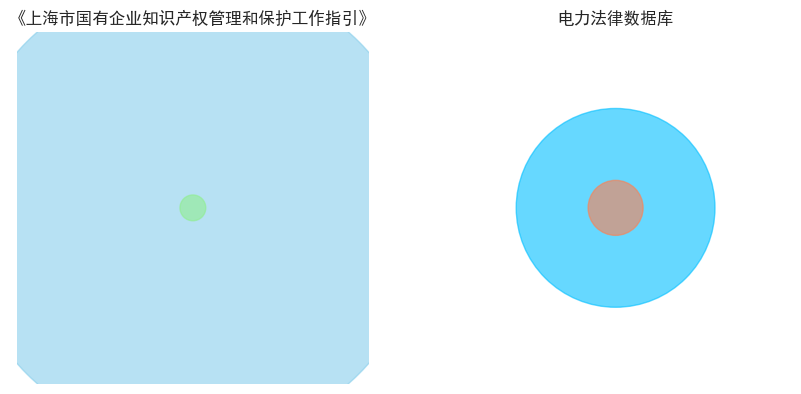

In [24]:
import matplotlib.pyplot as plt

# 定义数据
sizes_1 = [400, 22]
sizes_2 = [23540, 1802]

# 定义颜色
colors_1 = ['skyblue', 'lightgreen']
colors_2 = ['deepskyblue', 'coral']
# 创建一个图像
plt.figure(figsize=(10, 5))

# 第一个图
plt.subplot(121)
circle1 = plt.Circle((0.5, 0.5), radius=(sizes_1[0] / (1.5*sizes_1[0])) ** 1, color=colors_1[0], alpha=0.6)
circle2 = plt.Circle((0.5, 0.5), radius=(sizes_1[1] / (1.5*sizes_1[0])) ** 1, color=colors_1[1], alpha=0.6)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().set_aspect('equal')
plt.title('《上海市国有企业知识产权管理和保护工作指引》')
plt.axis('off')

# 第二个图
plt.subplot(122)
circle3 = plt.Circle((0.5, 0.5), radius=((sizes_2[0] / (3.14*sizes_2[0])) ** 0.5)/2, color=colors_2[0], alpha=0.6)
circle4 = plt.Circle((0.5, 0.5), radius=((sizes_2[1] / (3.14*sizes_2[0])) ** 0.5)/2, color=colors_2[1], alpha=0.6)
plt.gca().add_patch(circle3)
plt.gca().add_patch(circle4)
plt.gca().set_aspect('equal')
plt.title('电力法律数据库')
plt.axis('off')

plt.show()
